In [1]:
import jax
from jax.config import config
config.update("jax_enable_x64", True)

In [2]:
import scanpy as sc
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import moscot
from moscot.problems.time import TemporalProblem
import moscot.plotting as mpl
import pandas as pd
import os

import mplscience

mplscience.available_styles()
mplscience.set_style(reset_current=True)
plt.rcParams['legend.scatterpoints'] = 1 

/home/icb/dominik.klein/miniconda3/envs/jax_gpu3/lib/python3.8/site-packages/docrep/decorators.py:43: SyntaxWarning: 'parallel_kwargs' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


['default', 'despine']


In [3]:
output_dir = "."

In [4]:
adata_shared_embedding = sc.read_h5ad("/lustre/groups/ml01/workspace/moscot_paper/pancreas/embeddings/pancreas_shared_embeddings.h5ad")

In [5]:
adata = sc.read_h5ad("/lustre/groups/ml01/workspace/moscot_paper/pancreas/pancreas_multiome_2022_processed.h5ad")

In [6]:
adata_imputed_counts = sc.read_h5ad("/lustre/groups/ml01/workspace/moscot_paper/pancreas/embeddings/pancreas_ATAC_imputation.h5ad")

In [7]:
adata_imputed_counts.layers["log_imputed"] = sc.pp.log1p(adata_imputed_counts.layers["X_normalized"])

In [8]:
gene_names = adata[:,adata.var["modality"]=="GEX"].var_names

In [9]:
adata = adata[:, adata.var_names.isin(list(gene_names)+list(adata_imputed_counts.var.index))].copy()

In [10]:
adata.layers["ATAC_imputed"] = np.hstack((sc.pp.log1p(adata[:, adata.var["modality"]=="GEX"].X.A), adata_imputed_counts.layers["log_imputed"]))

In [11]:
new_annotation = pd.read_csv("../EDA/endocrine_refinement.csv")

In [12]:
adata.obs["Fev_delta_refinement"] = new_annotation["Fev_delta_refinement"].values
adata.obs["Ngn3_high_refinement"] = new_annotation["Ngn3_high_refinement"].values

In [13]:
endocrine_celltypes = [
    "Ngn3 low",
    "Ngn3 high",
    "Ngn3 high cycling",
    "Fev+",
    "Fev+ Alpha",
    "Fev+ Beta",
    "Fev+ Delta",
    "Eps. progenitors",
    "Alpha",
    "Beta",
    "Delta",
    "Epsilon"
]

In [14]:
adata_red = adata[adata.obs["celltype"].isin(endocrine_celltypes)].copy()
adata_shared_embedding_red = adata_shared_embedding[adata_shared_embedding.obs["celltype"].isin(endocrine_celltypes)].copy()

In [15]:
sc.tl.umap(adata_red)

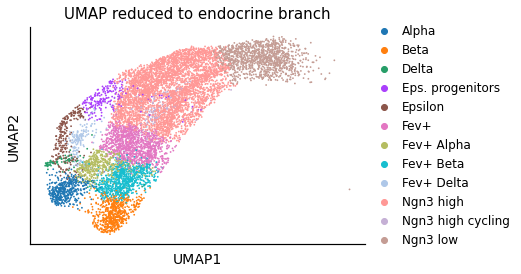

In [16]:
sc.pl.umap(adata_red, color="celltype", title="UMAP reduced to endocrine branch")

In [17]:
adata_red.obs['time'] = adata.obs.apply(lambda x: 14.5 if x["sample"]=="E14.5" else 15.5, axis=1)

In [18]:
def create_col(x):
    if x["celltype"] == "Ngn3 high":
        return x["Ngn3_high_refinement"]
    if x["celltype"] == "Fev+ Delta":
        return x["Fev_delta_refinement"]
    return x["celltype"]

adata_red.obs["refinement"] = adata_red.obs.apply(create_col, axis=1)

In [19]:
def create_col2(x):
    if x["refinement"] in ["Ngn3 high,0", "Ngn3 high,1", "Ngn3 high,2", "Ngn3 high,3", "Ngn3 high,4"]:
        return "Ngn3 high rest"
    return x["refinement"]

adata_red.obs["refinement_grouped"] = adata_red.obs.apply(create_col2, axis=1)

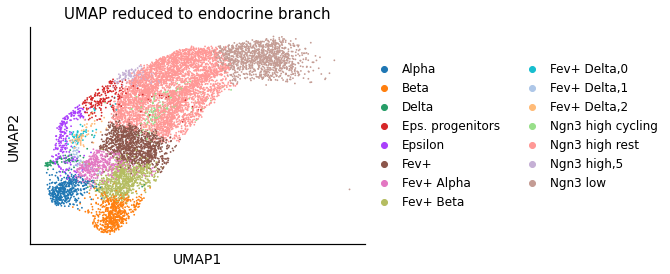

In [20]:
fig = sc.pl.umap(adata_red, color="refinement_grouped", title="UMAP reduced to endocrine branch", show=False)

In [21]:
fig.figure.savefig(os.path.join(output_dir, 'umap_endocrine_refinement_grouped.png'))

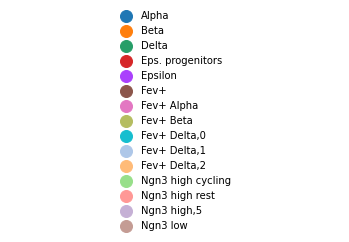

In [22]:
label_params = fig.get_legend_handles_labels() 
figl, axl = plt.subplots()
axl.axis(False)
axl.legend(*label_params, fontsize=5, loc="center", markerscale=2, bbox_to_anchor=(0.5, 0.5), prop={"size":10})

In [23]:
axl.figure.savefig(os.path.join(output_dir, 'endocrine_refinement_grouped_legend_only.png'))

# Heat kernel distances

In [24]:
import pygsp

In [25]:
sc.pp.neighbors(adata_shared_embedding_red, use_rep="X_multi_vi", key_added="multi_vi", n_neighbors=30)

In [26]:
cell_ids_source = adata_red[adata_red.obs["time"]==14.5].obs_names
cell_ids_target = adata_red[adata_red.obs["time"]==15.5].obs_names

In [27]:
assert (adata_red.obs.iloc[:(len(cell_ids_source))].index == cell_ids_source).all()
assert (adata_red.obs.iloc[(len(cell_ids_source)):].index == cell_ids_target).all()

In [28]:
G = pygsp.graphs.Graph(adata_shared_embedding_red.obsp["multi_vi_connectivities"])

In [29]:
G.estimate_lmax()

In [30]:
filt = pygsp.filters.Heat(G, tau=100)
diffusion_distances = filt.filter(np.eye(len(adata_red)))
custom_cost = pd.DataFrame(data=-np.log(diffusion_distances[:len(cell_ids_source), len(cell_ids_source):].copy())+1e-15, index=cell_ids_source, columns=cell_ids_target)

In [31]:
tp0 = TemporalProblem(adata_red)
tp0 = tp0.prepare("time", joint_attr="X_pca") # joint_attr does not matter here

In [32]:
tp0[14.5, 15.5].set_xy(custom_cost, tag="cost")

In [33]:
tp0 = tp0.solve(max_iterations=1e8)

INFO     Solving problem BirthDeathProblem[stage='prepared', shape=(5539, 3826)].            


Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

In [34]:
order_celltypes = ['Ngn3 low', 'Ngn3 high cycling', 'Ngn3 high', 'Eps. progenitors', 'Fev+', 'Fev+ Alpha', 
                   'Fev+ Beta', 'Fev+ Delta', 'Alpha', 'Beta', 'Delta', 'Epsilon']

In [35]:
_ = tp0.cell_transition(14.5, 15.5, {"celltype": order_celltypes}, {"celltype": order_celltypes}, forward=False)

Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid state in the child process.
Numba: Attempted to fork from a non-main thread, the TBB library may be in an invalid st

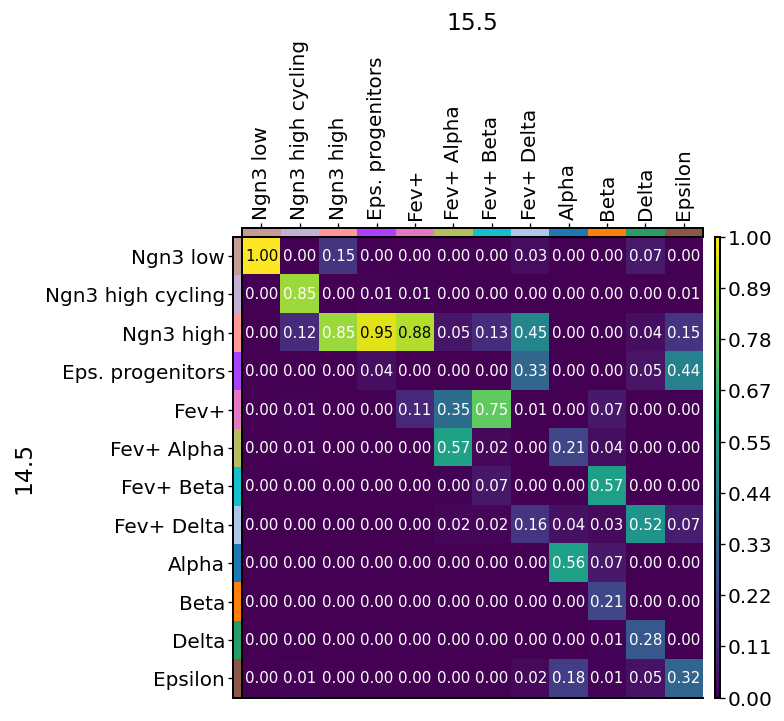

In [36]:
mpl.cell_transition(tp0, dpi=120, fontsize=9)

In [40]:
peaks = list(adata[:,adata.var["modality"]=="ATAC"].var_names)

In [41]:
genes = list(adata[:,adata.var["modality"]=="GEX"].var_names)

# Epsilon-Alpha

In [52]:
tp0.pull(14.5, 15.5, data="celltype", subset="Alpha", key_added="Alpha_pull")

In [55]:
Alpha_drivers = tp0.compute_feature_correlation(obs_key="Alpha_pull", layer="ATAC_imputed", features=genes)

In [56]:
Alpha_drivers

,Alpha_pull_corr,Alpha_pull_pval,Alpha_pull_qval,Alpha_pull_ci_low,Alpha_pull_ci_high
Cltrn,0.618459,0.000000e+00,0.000000e+00,NaN,NaN
Gcg,0.608024,0.000000e+00,0.000000e+00,NaN,NaN
Pou6f2,0.587902,0.000000e+00,0.000000e+00,NaN,NaN
Gria2,0.575727,0.000000e+00,0.000000e+00,NaN,NaN
Irx2,0.569745,0.000000e+00,0.000000e+00,NaN,NaN
...,...,...,...,...,...
Neurog3,-0.263585,2.143487e-150,2.555280e-148,NaN,NaN
Btg2,-0.273806,9.436643e-163,1.281199e-160,NaN,NaN
Pard3,-0.275344,1.163510e-164,1.609485e-162,NaN,NaN
Nkx6-1,-0.279716,3.712226e-170,5.498220e-168,NaN,NaN


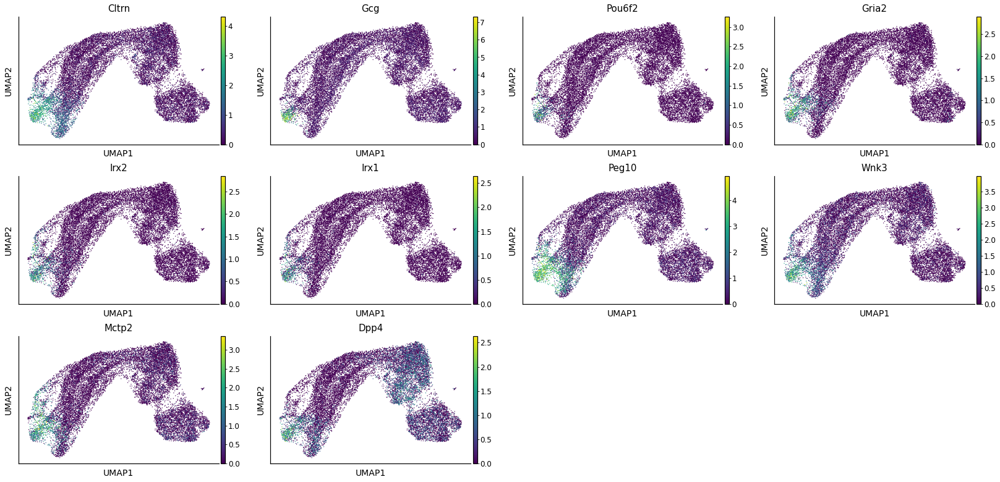

In [57]:
sc.pl.umap(adata, color=Alpha_drivers.index[:10], layer="ATAC_imputed")

In [58]:
subset={"refinement": ["Alpha", "Epsilon"]}

In [59]:
eps_to_alpha_drivers = tp0.compute_feature_correlation(obs_key="Alpha_pull", layer="ATAC_imputed", features=genes, annotation=subset)

In [60]:
eps_to_alpha_drivers

,Alpha_pull_corr,Alpha_pull_pval,Alpha_pull_qval,Alpha_pull_ci_low,Alpha_pull_ci_high
Pcsk2,0.610572,3.976695e-79,2.901198e-75,NaN,NaN
Cltrn,0.580561,2.481847e-69,1.207088e-65,NaN,NaN
Ttr,0.579763,4.358521e-69,1.271904e-65,NaN,NaN
Gnas,0.572549,6.526700e-67,1.587185e-63,NaN,NaN
Pcsk1n,0.556054,3.642647e-62,7.592837e-59,NaN,NaN
...,...,...,...,...,...
Angpt1,NaN,NaN,NaN,NaN,NaN
Cbr3,NaN,NaN,NaN,NaN,NaN
Cyp4f15,NaN,NaN,NaN,NaN,NaN
2010110K18Rik,NaN,NaN,NaN,NaN,NaN


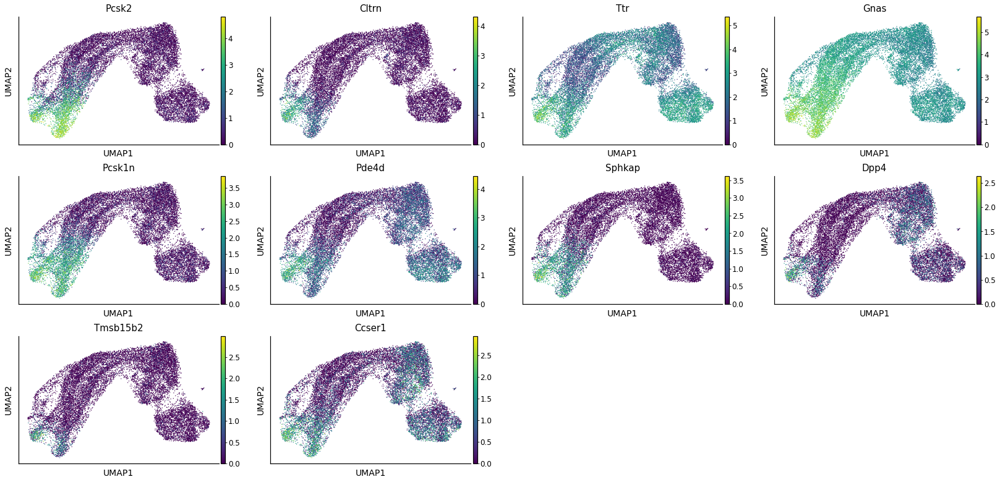

In [61]:
sc.pl.umap(adata, color=eps_to_alpha_drivers.index[:10], layer="ATAC_imputed")

In [65]:
eps_to_alpha_drivers_tfs = tp0.compute_feature_correlation(obs_key="Alpha_pull", layer="ATAC_imputed", features="mouse", annotation=subset)

In [66]:
eps_to_alpha_drivers_tfs

,Alpha_pull_corr,Alpha_pull_pval,Alpha_pull_qval,Alpha_pull_ci_low,Alpha_pull_ci_high
Zbtb20,0.456034,5.427700e-39,3.587709e-36,NaN,NaN
Smarca1,0.449203,1.056946e-37,3.493208e-35,NaN,NaN
Rora,0.442001,2.232723e-36,5.903321e-34,NaN,NaN
Meis2,0.418752,2.470264e-32,4.665270e-30,NaN,NaN
Mafb,0.383933,6.824958e-27,1.127824e-24,NaN,NaN
...,...,...,...,...,...
Gbx1,NaN,NaN,NaN,NaN,NaN
Tead4,NaN,NaN,NaN,NaN,NaN
Aire,NaN,NaN,NaN,NaN,NaN
Tbx3,NaN,NaN,NaN,NaN,NaN


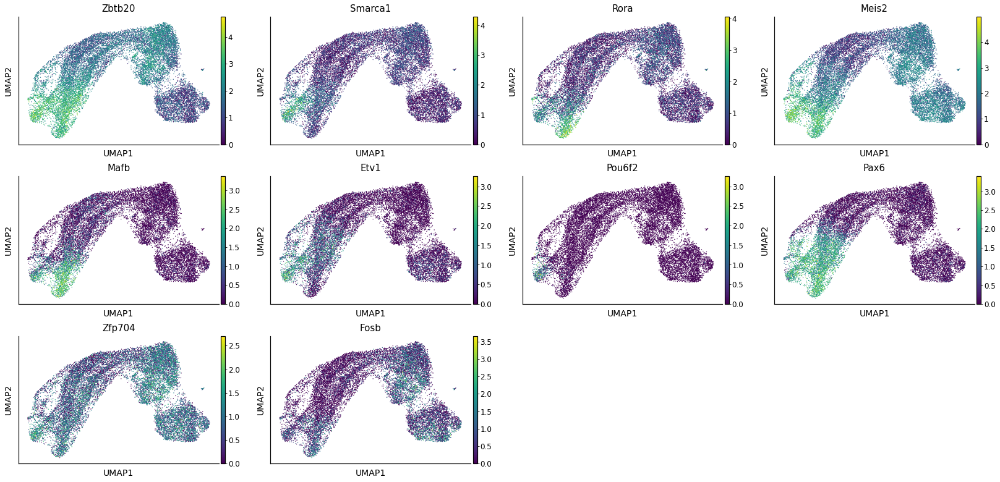

In [67]:
sc.pl.umap(adata, color=eps_to_alpha_drivers_tfs.index[:10], layer="ATAC_imputed")

In [68]:
eps_to_alpha_drivers_peaks = tp0.compute_feature_correlation(obs_key="Alpha_pull", layer="ATAC_imputed", features=peaks, annotation=subset)

In [69]:
eps_to_alpha_drivers_peaks

,Alpha_pull_corr,Alpha_pull_pval,Alpha_pull_qval,Alpha_pull_ci_low,Alpha_pull_ci_high
10-11870920-11871828,0.457735,2.561319e-39,9.918587e-38,NaN,NaN
18-28567453-28568394,0.455545,6.731788e-39,2.489614e-37,NaN,NaN
3-128369339-128370263,0.448194,1.628401e-37,5.194697e-36,NaN,NaN
3-26641152-26642046,0.444271,8.610707e-37,2.552697e-35,NaN,NaN
1-9289657-9290577,0.442178,2.073190e-36,5.920119e-35,NaN,NaN
...,...,...,...,...,...
4-120701867-120702777,-0.577407,2.274215e-68,5.722652e-64,NaN,NaN
11-22372465-22373371,-0.581841,1.002008e-69,3.151716e-65,NaN,NaN
4-154182824-154183713,-0.584932,1.100217e-70,4.614162e-66,NaN,NaN
3-49032711-49033622,-0.586164,4.528029e-71,2.848493e-66,NaN,NaN


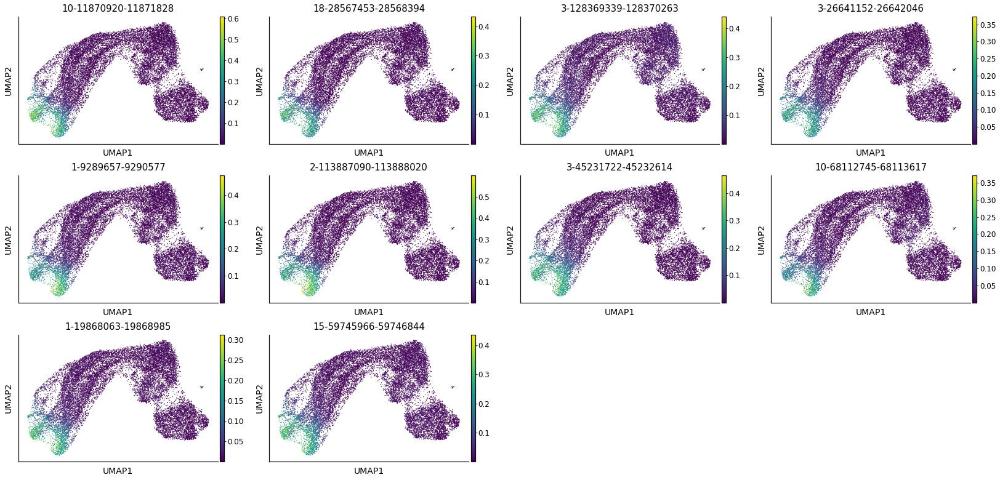

In [71]:
sc.pl.umap(adata, color=eps_to_alpha_drivers_peaks.index[:10], layer="ATAC_imputed")

In [93]:
def eps_to_alpha(x):
    if x["celltype"] in (("Fev", "Beta", "Delta")):
        return -x["Alpha_pull"]
    return x["Alpha_pull"]
adata_red.obs["eps_to_alpha"] = adata_red.obs.apply(eps_to_alpha, axis=1)

def delta_to_alpha(x):
    if x["celltype"] in (("Fev", "Beta", "Epsilon")):
        return -x["Alpha_pull"]
    return x["Alpha_pull"]
adata_red.obs["delta_to_alpha"] = adata_red.obs.apply(delta_to_alpha, axis=1)

In [94]:
eps_to_alpha = tp0.compute_feature_correlation(obs_key="eps_to_alpha", layer="ATAC_imputed", features=genes)

In [95]:
eps_to_alpha

,eps_to_alpha_corr,eps_to_alpha_pval,eps_to_alpha_qval,eps_to_alpha_ci_low,eps_to_alpha_ci_high
Cltrn,0.618050,0.000000e+00,0.000000e+00,NaN,NaN
Gcg,0.608056,0.000000e+00,0.000000e+00,NaN,NaN
Pou6f2,0.587914,0.000000e+00,0.000000e+00,NaN,NaN
Gria2,0.575353,0.000000e+00,0.000000e+00,NaN,NaN
Irx2,0.569780,0.000000e+00,0.000000e+00,NaN,NaN
...,...,...,...,...,...
Neurog3,-0.263243,5.415885e-150,6.404284e-148,NaN,NaN
Btg2,-0.273612,1.640086e-162,2.206291e-160,NaN,NaN
Pard3,-0.274899,4.170601e-164,5.715282e-162,NaN,NaN
Nkx6-1,-0.279496,7.057114e-170,1.045237e-167,NaN,NaN


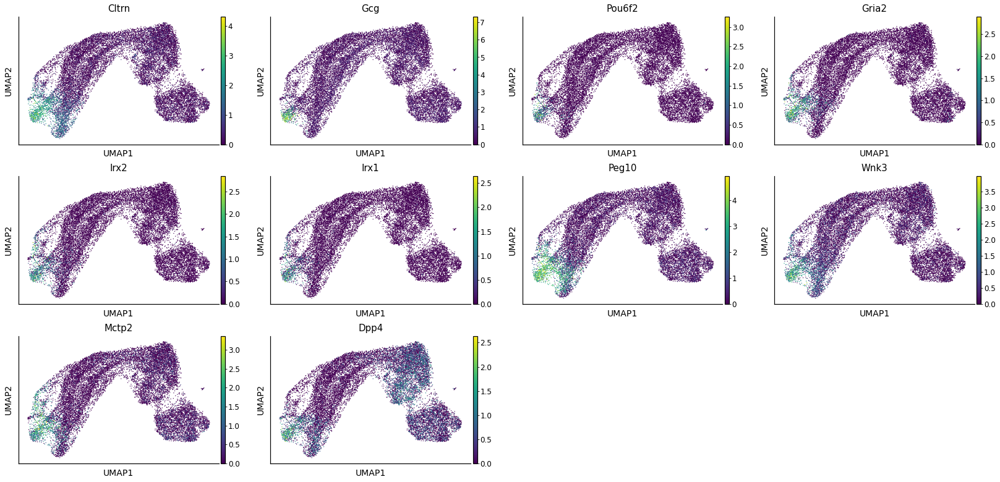

In [96]:
sc.pl.umap(adata, color=eps_to_alpha.index[:10], layer="ATAC_imputed")

In [97]:
eps_to_alpha_tfs = tp0.compute_feature_correlation(obs_key="eps_to_alpha", layer="ATAC_imputed", features="mouse")

In [98]:
eps_to_alpha_tfs

,eps_to_alpha_corr,eps_to_alpha_pval,eps_to_alpha_qval,eps_to_alpha_ci_low,eps_to_alpha_ci_high
Pou6f2,0.587914,0.000000e+00,0.000000e+00,NaN,NaN
Irx2,0.569780,0.000000e+00,0.000000e+00,NaN,NaN
Irx1,0.552486,0.000000e+00,0.000000e+00,NaN,NaN
Mctp2,0.518871,0.000000e+00,0.000000e+00,NaN,NaN
Smarca1,0.460103,0.000000e+00,0.000000e+00,NaN,NaN
...,...,...,...,...,...
Hes6,-0.206228,3.978008e-91,2.401270e-89,NaN,NaN
Gadd45a,-0.208673,2.558746e-93,1.618102e-91,NaN,NaN
Neurog3,-0.263243,5.415885e-150,4.495184e-148,NaN,NaN
Nkx6-1,-0.279496,7.057114e-170,7.209113e-168,NaN,NaN


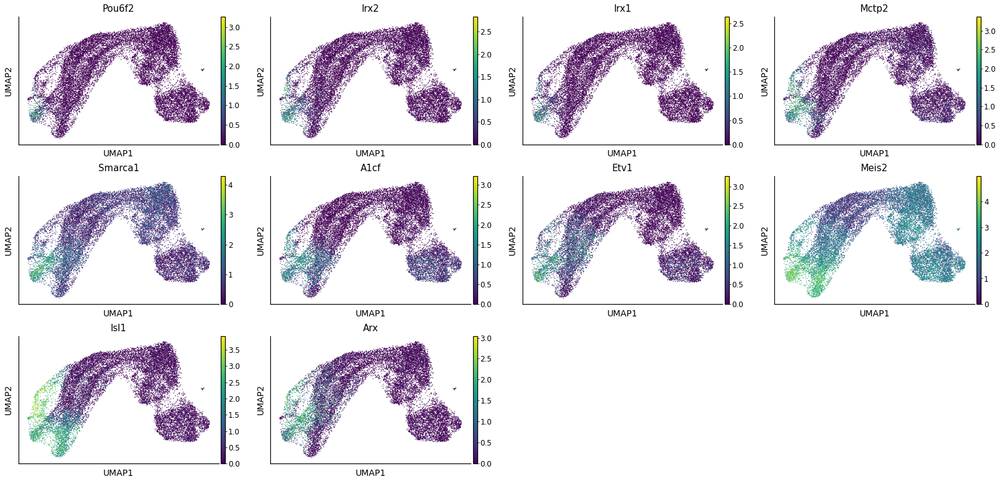

In [99]:
sc.pl.umap(adata, color=eps_to_alpha_tfs.index[:10], layer="ATAC_imputed")

In [102]:
eps_to_alpha_peaks = tp0.compute_feature_correlation(obs_key="eps_to_alpha", layer="ATAC_imputed", features=peaks)

In [103]:
eps_to_alpha_peaks

,eps_to_alpha_corr,eps_to_alpha_pval,eps_to_alpha_qval,eps_to_alpha_ci_low,eps_to_alpha_ci_high
19-60167711-60168625,0.677619,0.000000e+00,0.000000e+00,NaN,NaN
14-93825518-93826591,0.666448,0.000000e+00,0.000000e+00,NaN,NaN
3-154084552-154085465,0.665805,0.000000e+00,0.000000e+00,NaN,NaN
16-70767846-70768746,0.663222,0.000000e+00,0.000000e+00,NaN,NaN
3-17473827-17474733,0.656344,0.000000e+00,0.000000e+00,NaN,NaN
...,...,...,...,...,...
12-51345863-51346735,-0.334955,4.100284e-249,2.314407e-247,NaN,NaN
9-49980556-49981443,-0.335469,6.177333e-250,3.499358e-248,NaN,NaN
11-86586882-86587771,-0.336191,4.308893e-251,2.453067e-249,NaN,NaN
1-152815005-152815924,-0.344129,4.917435e-264,3.022433e-262,NaN,NaN


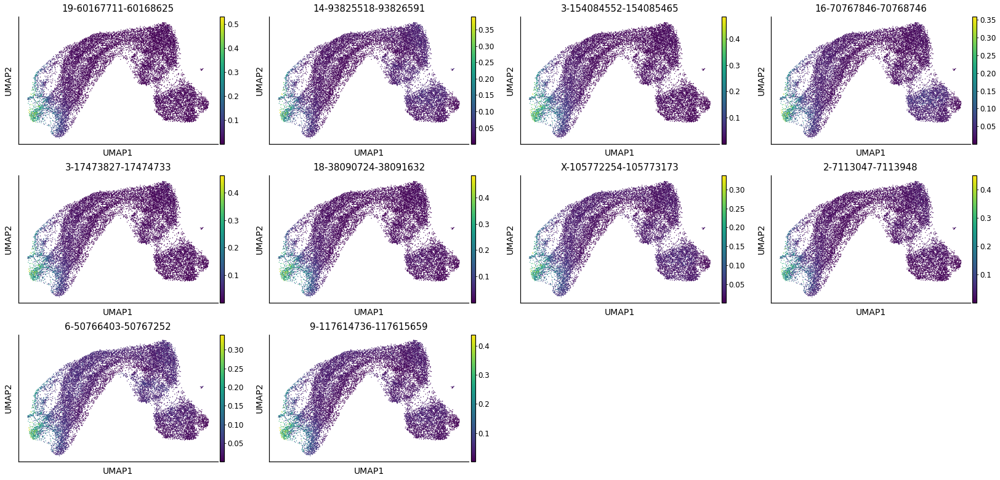

In [104]:
sc.pl.umap(adata, color=eps_to_alpha_peaks.index[:10], layer="ATAC_imputed")

# Fev+ Delta to Alpha

In [105]:
delta_to_alpha = tp0.compute_feature_correlation(obs_key="delta_to_alpha", layer="ATAC_imputed", features=genes)

In [106]:
delta_to_alpha

,delta_to_alpha_corr,delta_to_alpha_pval,delta_to_alpha_qval,delta_to_alpha_ci_low,delta_to_alpha_ci_high
Gcg,0.604619,0.000000e+00,0.000000e+00,NaN,NaN
Cltrn,0.551767,0.000000e+00,0.000000e+00,NaN,NaN
Pou6f2,0.513037,0.000000e+00,0.000000e+00,NaN,NaN
Dpp4,0.499561,0.000000e+00,0.000000e+00,NaN,NaN
Gria2,0.496180,0.000000e+00,0.000000e+00,NaN,NaN
...,...,...,...,...,...
Pclo,-0.228196,7.236371e-112,8.354874e-110,NaN,NaN
Neurog3,-0.232850,1.441321e-116,1.746619e-114,NaN,NaN
Btg2,-0.235697,1.698851e-119,2.129082e-117,NaN,NaN
Pard3,-0.244251,1.517490e-128,2.079528e-126,NaN,NaN


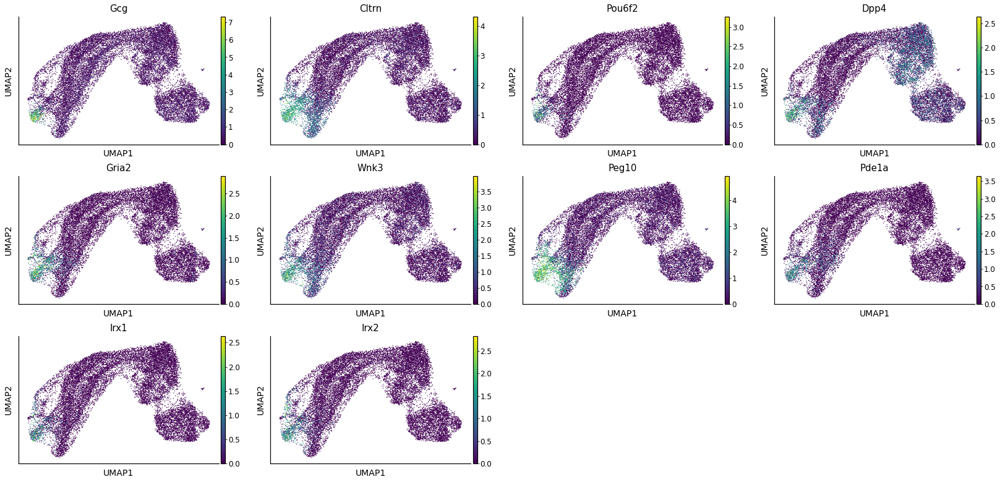

In [108]:
sc.pl.umap(adata, color=delta_to_alpha.index[:10], layer="ATAC_imputed")

In [109]:
delta_to_alpha_tfs = tp0.compute_feature_correlation(obs_key="delta_to_alpha", layer="ATAC_imputed", features="mouse")

In [110]:
delta_to_alpha_tfs

,delta_to_alpha_corr,delta_to_alpha_pval,delta_to_alpha_qval,delta_to_alpha_ci_low,delta_to_alpha_ci_high
Pou6f2,0.513037,0.000000e+00,0.000000e+00,NaN,NaN
Irx1,0.468439,0.000000e+00,0.000000e+00,NaN,NaN
Irx2,0.458667,0.000000e+00,0.000000e+00,NaN,NaN
Smarca1,0.424344,0.000000e+00,0.000000e+00,NaN,NaN
Mctp2,0.416704,0.000000e+00,0.000000e+00,NaN,NaN
...,...,...,...,...,...
Hes6,-0.171639,3.822461e-63,2.115095e-61,NaN,NaN
Gadd45a,-0.176158,1.747237e-66,1.054696e-64,NaN,NaN
Nkx6-1,-0.214398,1.451994e-98,1.377320e-96,NaN,NaN
Neurog3,-0.232850,1.441321e-116,1.595062e-114,NaN,NaN


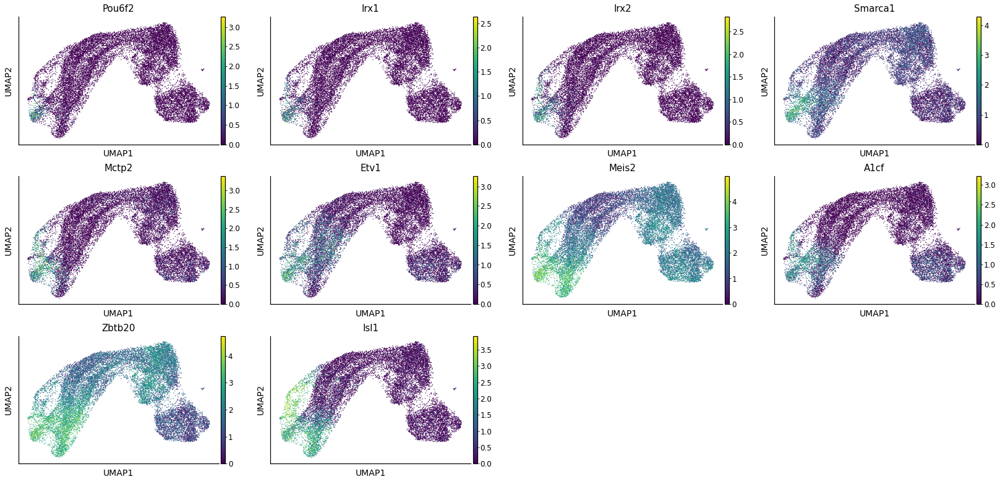

In [111]:
sc.pl.umap(adata, color=delta_to_alpha_tfs.index[:10], layer="ATAC_imputed")

In [112]:
delta_to_alpha_peaks = tp0.compute_feature_correlation(obs_key="delta_to_alpha", layer="ATAC_imputed", features=peaks)

In [113]:
delta_to_alpha_peaks

,delta_to_alpha_corr,delta_to_alpha_pval,delta_to_alpha_qval,delta_to_alpha_ci_low,delta_to_alpha_ci_high
18-38090724-38091632,0.534677,0.000000e+00,0.000000e+00,NaN,NaN
2-22029089-22030038,0.531741,0.000000e+00,0.000000e+00,NaN,NaN
2-62621256-62622186,0.525723,0.000000e+00,0.000000e+00,NaN,NaN
19-60167711-60168625,0.519940,0.000000e+00,0.000000e+00,NaN,NaN
12-41764400-41765321,0.516010,0.000000e+00,0.000000e+00,NaN,NaN
...,...,...,...,...,...
8-106134768-106135713,-0.297436,1.569510e-193,1.329761e-191,NaN,NaN
2-152804099-152804983,-0.297929,3.307601e-194,2.817529e-192,NaN,NaN
18-74829688-74830601,-0.298197,1.419969e-194,1.214513e-192,NaN,NaN
11-86586882-86587771,-0.298235,1.259288e-194,1.077813e-192,NaN,NaN


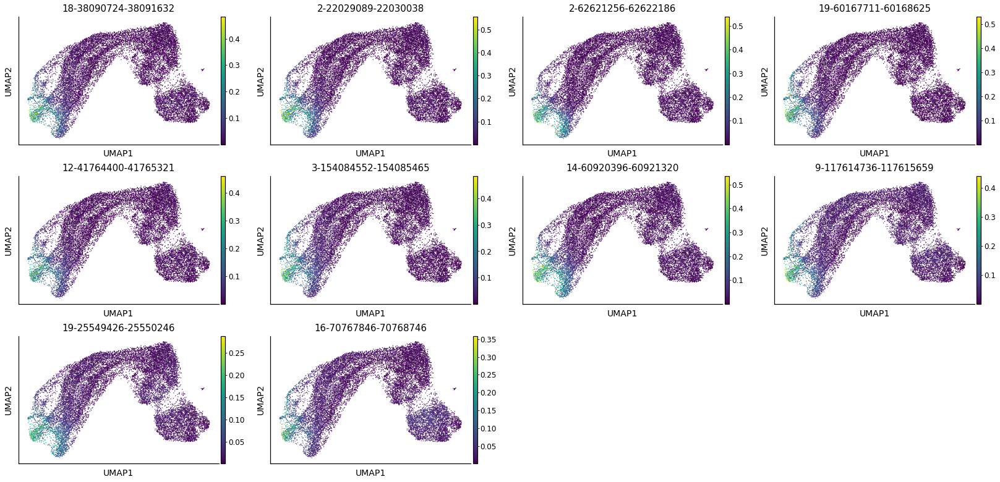

In [114]:
sc.pl.umap(adata, color=delta_to_alpha_peaks.index[:10], layer="ATAC_imputed")